
=== Reference DEM (GAN-filled) ===
CRS: PROJCS["Albers_Conic_Equal_Area",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",36],PARAMETER["longitude_of_center",85],PARAMETER["standard_parallel_1",25],PARAMETER["standard_parallel_2",47],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
Dimensions: (1848, 1792)
Reference DEM (raw elevation): min=1235.798, max=4576.378, mean=2446.254, std=686.443, skew=0.069


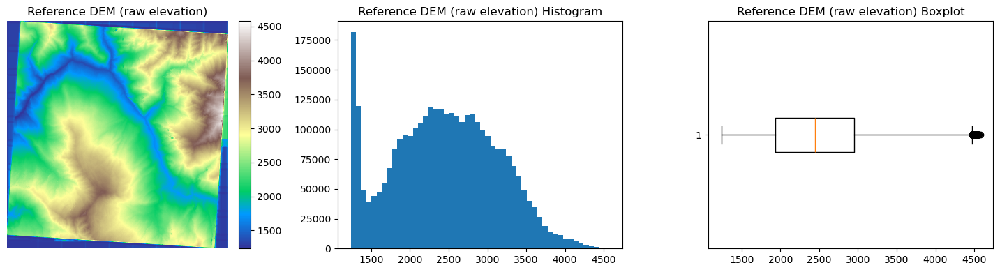


=== Processing 'alos_dem' ===
alos_dem (aligned, raw): min=1259.142, max=4485.783, mean=2566.992, std=600.672, skew=0.193


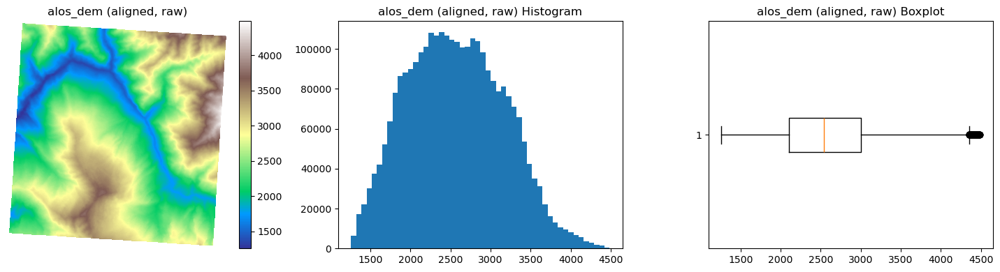

alos_dem (processed): min=1259.142, max=4485.783, mean=2566.992, std=600.672, skew=0.193


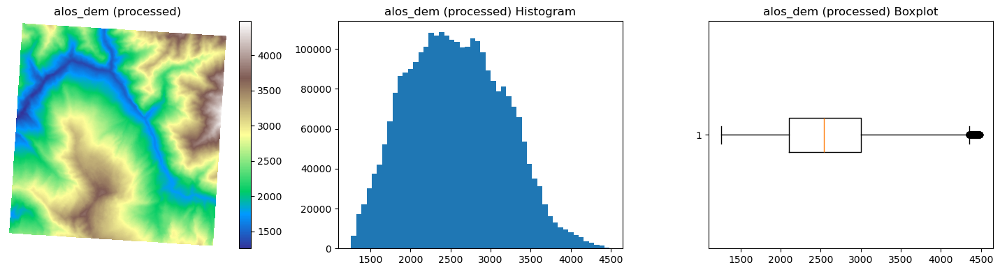


=== Processing 'flow_accu' ===
flow_accu (aligned, raw): min=0.000, max=1.000, mean=0.183, std=0.206, skew=1.708


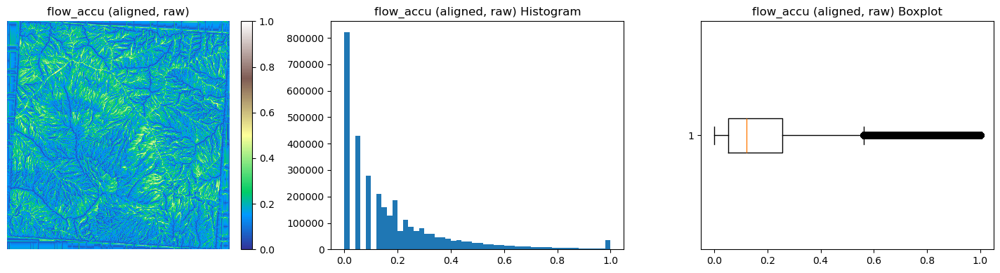

flow_accu (processed): min=0.000, max=1.000, mean=0.183, std=0.206, skew=1.708


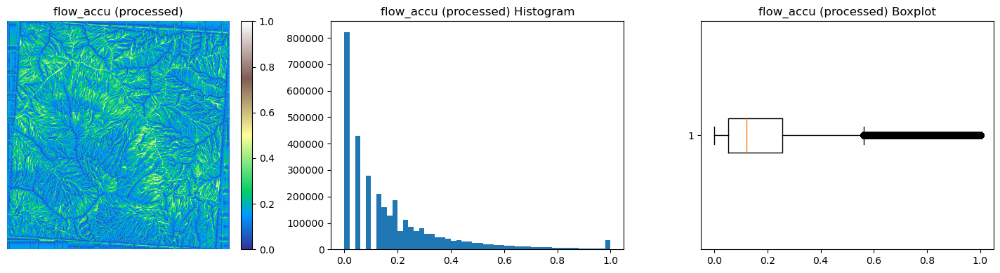


=== Processing 'plan_curv' ===
plan_curv (aligned, raw): min=-8.487, max=6.912, mean=0.008, std=2.197, skew=-0.011


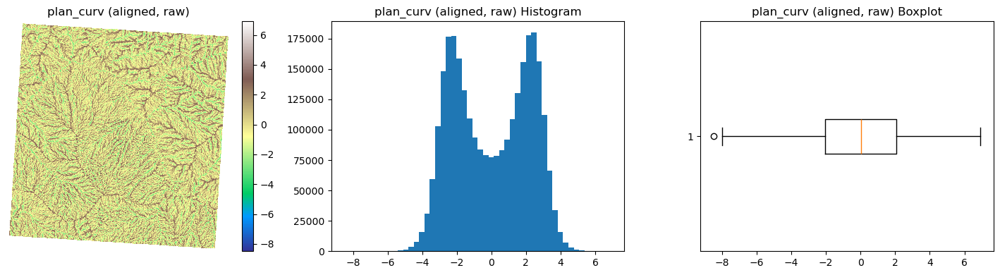

plan_curv (processed): min=0.000, max=1.000, mean=0.506, std=0.364, skew=-0.008


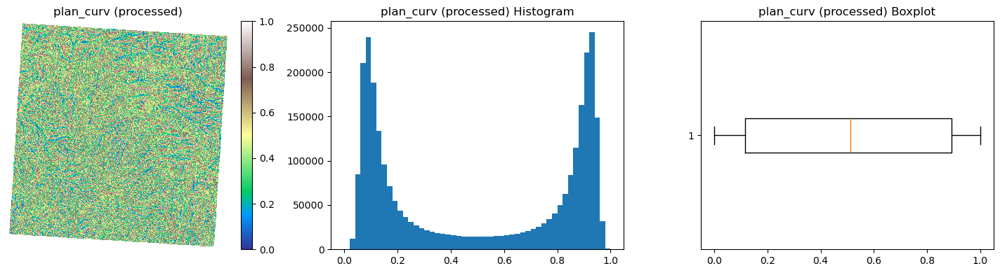


=== Processing 'slope' ===
slope (aligned, raw): min=0.000, max=80.137, mean=33.126, std=13.255, skew=0.176


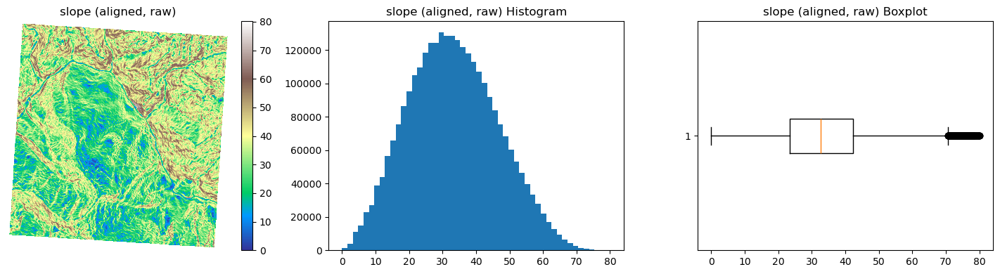

slope (processed): min=0.000, max=1.000, mean=0.413, std=0.165, skew=0.176


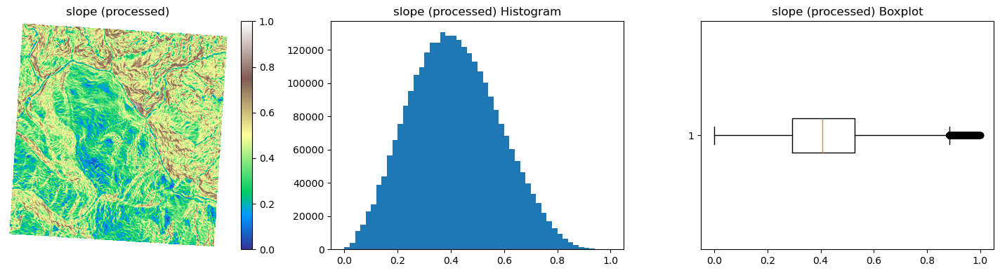


=== Processing 'prof_curv' ===
prof_curv (aligned, raw): min=-4.420, max=4.520, mean=-0.023, std=1.495, skew=0.010


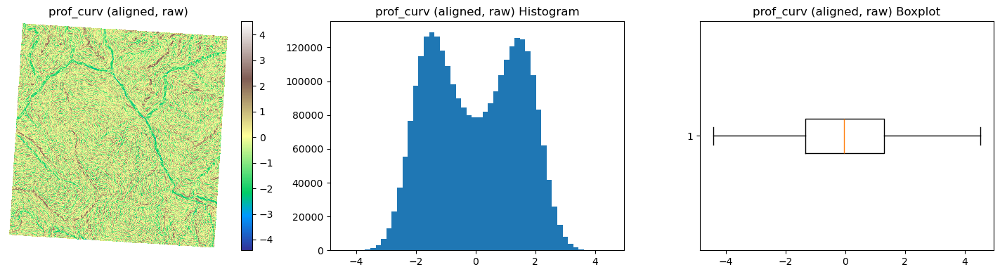

prof_curv (processed): min=0.000, max=1.000, mean=0.495, std=0.328, skew=0.020


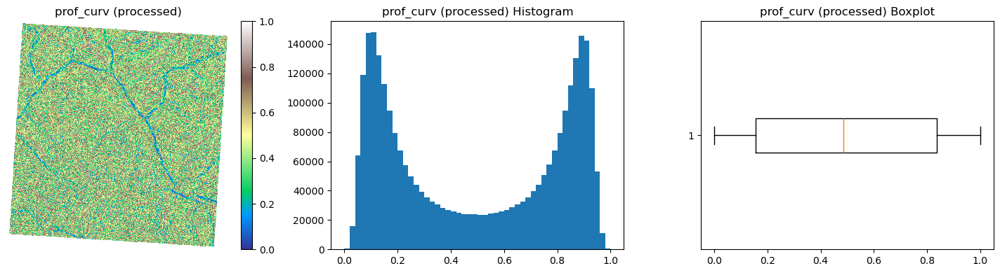


=== Processing 'tang_curv' ===
tang_curv (aligned, raw): min=-4.826, max=4.526, mean=0.009, std=1.648, skew=-0.004


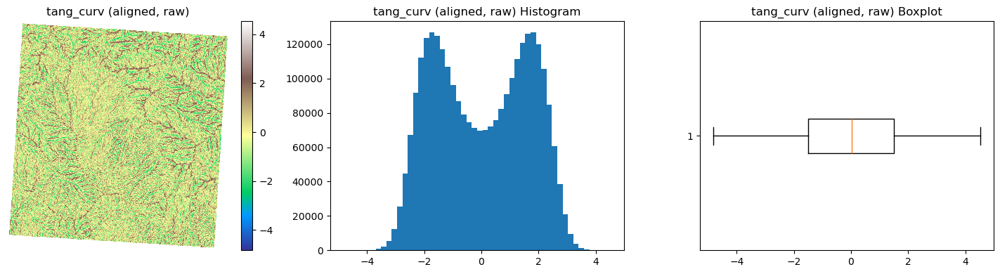

tang_curv (processed): min=0.000, max=1.000, mean=0.504, std=0.343, skew=-0.007


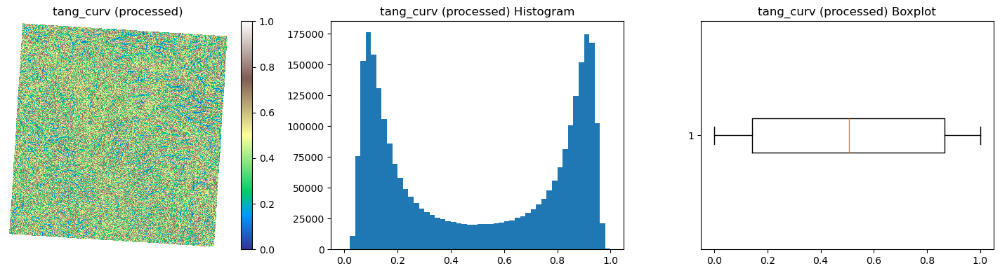


=== Processing 'str1500' ===
str1500 (aligned, raw): min=0.000, max=1.000, mean=0.017, std=0.129, skew=7.520


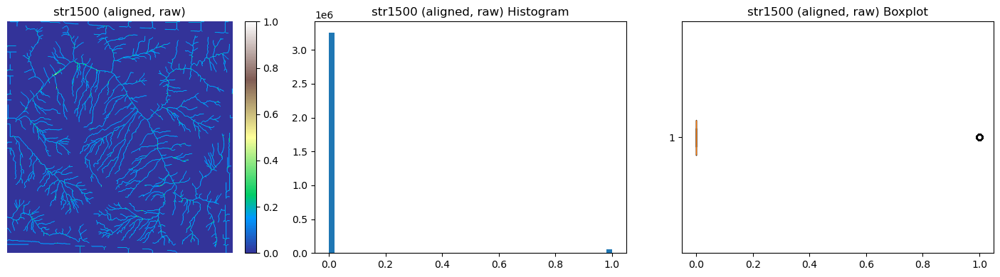

str1500 (processed): min=0.000, max=1.000, mean=0.017, std=0.129, skew=7.520


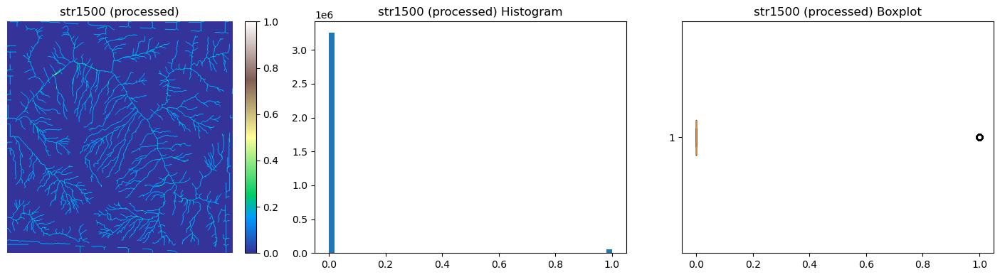


=== Processing 's2_b1' ===
s2_b1 (aligned, raw): min=0.008, max=1.000, mean=0.208, std=0.173, skew=3.405


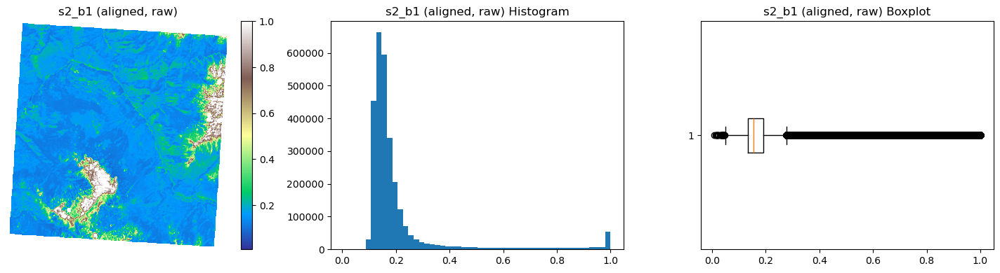

s2_b1 (processed): min=0.000, max=1.000, mean=0.202, std=0.174, skew=3.405


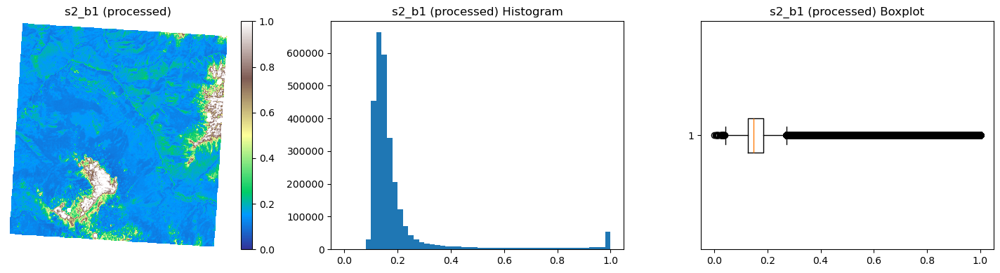


=== Processing 's2_b2' ===
s2_b2 (aligned, raw): min=0.013, max=1.000, mean=0.226, std=0.168, skew=3.342


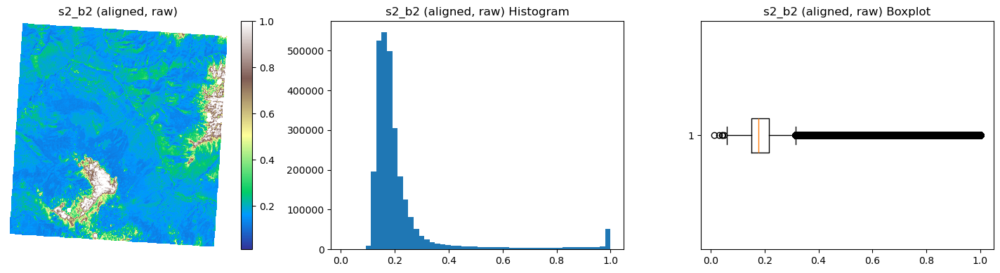

s2_b2 (processed): min=0.000, max=1.000, mean=0.216, std=0.170, skew=3.342


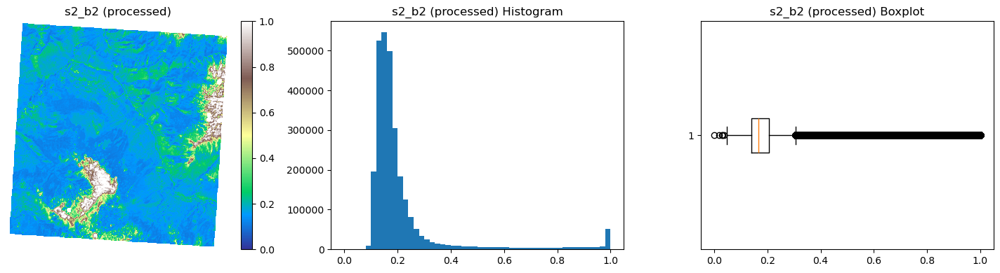


=== Processing 's2_b3' ===
s2_b3 (aligned, raw): min=0.017, max=1.000, mean=0.237, std=0.170, skew=3.120


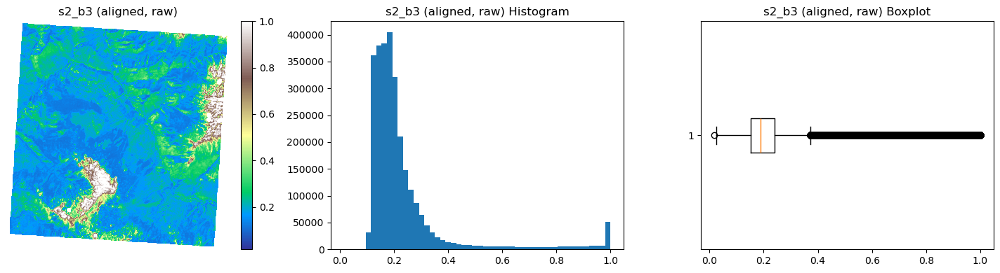

s2_b3 (processed): min=0.000, max=1.000, mean=0.224, std=0.173, skew=3.120


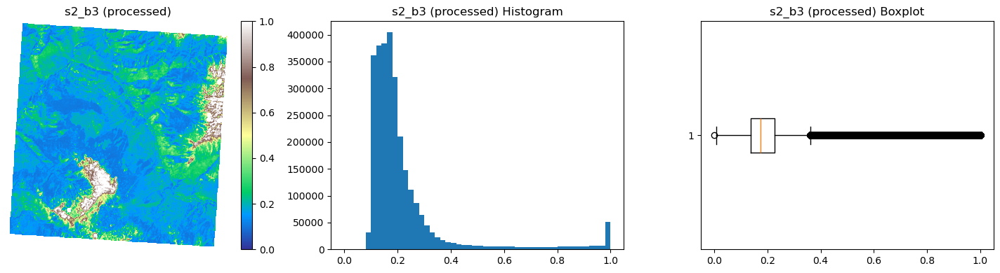


=== Processing 's2_b4' ===
s2_b4 (aligned, raw): min=0.095, max=1.000, mean=0.351, std=0.144, skew=2.719


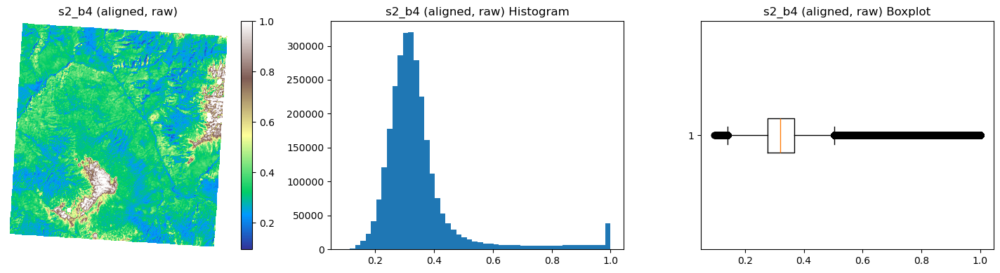

s2_b4 (processed): min=0.000, max=1.000, mean=0.283, std=0.159, skew=2.719


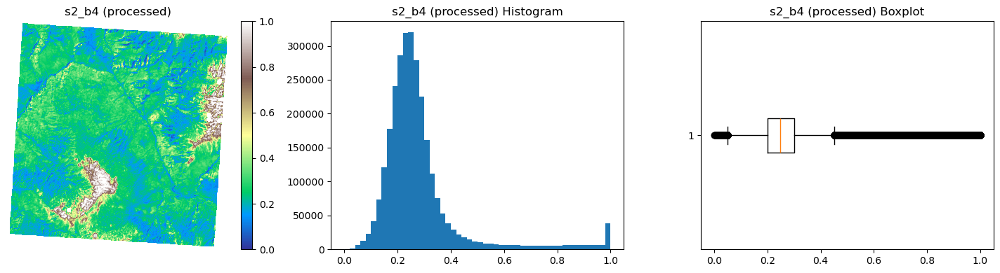


✅ All rasters processed, with ALOS DEM and flow_accu kept in original units and all others normalized to [0–1].


In [2]:
import os
import numpy as np
import rasterio
from rasterio.warp import reproject, Resampling
from rasterio.fill import fillnodata
import matplotlib.pyplot as plt
from scipy import stats

# --------------------------
# 0. Normalization / Transforms
# --------------------------

def min_max_normalize(arr):
    """Scale array to [0,1]."""
    a, b = np.nanmin(arr), np.nanmax(arr)
    return (arr - a) / (b - a + 1e-12)

def arctan_transform(arr):
    """Squeeze extreme curvature values."""
    return np.arctan(arr)

# --------------------------
# 1. Filepaths
# --------------------------

alos_dem_path   = 'Alos_Resampled_2.tif'      # original ALOS DEM
ref_dem_path    = 'Filled_DEM_GAN__2.tif'     # high‑res validation DEM

data_files = {
    'alos_dem':     alos_dem_path,            # skip normalization
    'flow_accu':    'Flow_accu_2.tif',        # skip normalization
    'plan_curv':    'Plan_Curv.tif',          # arctan + normalize

    'slope':     'Slope.tif',                 # Normalize
    'prof_curv':    'Profile_Curv.tif',       # arctan + normalize
    'tang_curv':    'Tangential_Curv.tif',    # arctan + normalize
    'str1500':      'Stream_1500.tif',        # normalize
    's2_b1':        'Sentinel_1.tif',         # normalize
    's2_b2':        'Sentinel_2.tif',         # normalize
    's2_b3':        'Sentinel_3.tif',         # normalize
    's2_b4':        'Sentinel_4.tif',         # normalize
}

# --------------------------
# 2. Load & Visualize DEMs
# --------------------------

def load_raster(path):
    with rasterio.open(path) as src:
        arr = src.read(1).astype(np.float32)
        meta = src.meta.copy()
    return arr, meta

def print_stats(arr, name):
    flat = arr.flatten()[~np.isnan(arr.flatten())]
    if flat.size == 0:
        print(f"{name}: no valid data")
        return
    mn, mx = flat.min(), flat.max()
    mu, sd = flat.mean(), flat.std()
    sk      = stats.skew(flat)
    print(f"{name}: min={mn:.3f}, max={mx:.3f}, mean={mu:.3f}, std={sd:.3f}, skew={sk:.3f}")

def plot_all(arr, name):
    flat = arr.flatten()[~np.isnan(arr.flatten())]
    if flat.size == 0:
        print(f"{name}: no data to plot")
        return
    fig, axes = plt.subplots(1,3, figsize=(15,4))
    im = axes[0].imshow(arr, cmap='terrain')
    axes[0].set_title(name); axes[0].axis('off')
    plt.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)
    axes[1].hist(flat, bins=50)
    axes[1].set_title(f"{name} Histogram")
    axes[2].boxplot(flat, vert=False)
    axes[2].set_title(f"{name} Boxplot")
    plt.tight_layout()
    plt.show()

# --------------------------
# 3. Reproject & Fill Helper
# --------------------------

def reproject_and_fill(path, ref_meta, resampling):
    """Reprojects any input raster to the exact grid of ref_meta, then fills nodata."""
    with rasterio.open(path) as src:
        arr = src.read(1).astype(np.float32)
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan

        # Allocate an array with the same shape as the Reference DEM
        dst = np.empty((ref_meta['height'], ref_meta['width']), dtype=np.float32)

        # Reproject into the Reference DEM’s CRS, transform, and resolution
        reproject(
            source=arr, destination=dst,
            src_transform=src.transform, src_crs=src.crs,
            dst_transform=ref_meta['transform'], dst_crs=ref_meta['crs'],
            resampling=resampling,
            src_nodata=np.nan, dst_nodata=np.nan
        )

        # Fill any small gaps created by reprojection
        mask = np.isnan(dst)
        filled = fillnodata(dst, mask=mask, max_search_distance=10, smoothing_iterations=0)

        # If Sentinel band, scale from 0–10000 to 0–1 before normalization
        if os.path.basename(path).lower().startswith('sentinel'):
            filled = np.clip(filled / 10000.0, 0, 1)

    return filled

# --------------------------
# 4. Main Workflow
# --------------------------

if __name__ == "__main__":
    # 4.1 Load Reference DEM (master grid)
    ref_data, ref_meta = load_raster(ref_dem_path)
    print("\n=== Reference DEM (GAN-filled) ===")
    print(f"CRS: {ref_meta['crs']}")
    print(f"Dimensions: {ref_data.shape}")
    print_stats(ref_data, "Reference DEM (raw elevation)")
    plot_all(ref_data, "Reference DEM (raw elevation)")

    processed = {}

    # 4.2 Process every input—including ALOS DEM—onto the Reference DEM grid
    for key, path in data_files.items():
        print(f"\n=== Processing '{key}' ===")
        is_stream = key.startswith('str')
        resamp = Resampling.nearest if is_stream else Resampling.bilinear

        # Reproject & fill to match ref_meta exactly
        aligned = reproject_and_fill(path, ref_meta, resamp)

        print_stats(aligned, f"{key} (aligned, raw)")
        plot_all(aligned, f"{key} (aligned, raw)")

        # Decide whether to normalize
        if key in ['alos_dem', 'flow_accu']:
            norm = aligned
        elif key in ['plan_curv','prof_curv','tang_curv']:
            norm = min_max_normalize(arctan_transform(aligned))
        elif key == 'slope':
            # slope: just min–max normalize
            norm = min_max_normalize(aligned)
            
            
        else:
            norm = min_max_normalize(aligned)

        print_stats(norm, f"{key} (processed)")
        plot_all(norm, f"{key} (processed)")

        processed[key] = norm

    print("\n✅ All rasters processed, with ALOS DEM and flow_accu kept in original units and all others normalized to [0–1].")


Patch statistics:
------------------------------------------------------------
Patch  1 @ ( 395,  203): min=1258.25, max=2362.97, mean=1712.33, median=1659.41, std=283.00
Patch  2 @ ( 263,  775): min=1391.07, max=2745.41, mean=1869.39, median=1828.35, std=301.46
Patch  3 @ ( 283, 1251): min=2067.24, max=3425.95, mean=2746.20, median=2750.19, std=301.44
Patch  4 @ (1163, 1251): min=1706.50, max=3113.37, mean=2091.16, median=1948.61, std=335.06
Patch  5 @ (1287,  631): min=2942.66, max=3771.61, mean=3438.99, median=3466.07, std=174.75
Patch  6 @ (1227,  155): min=2245.87, max=3062.69, mean=2697.94, median=2716.44, std=197.64
------------------------------------------------------------


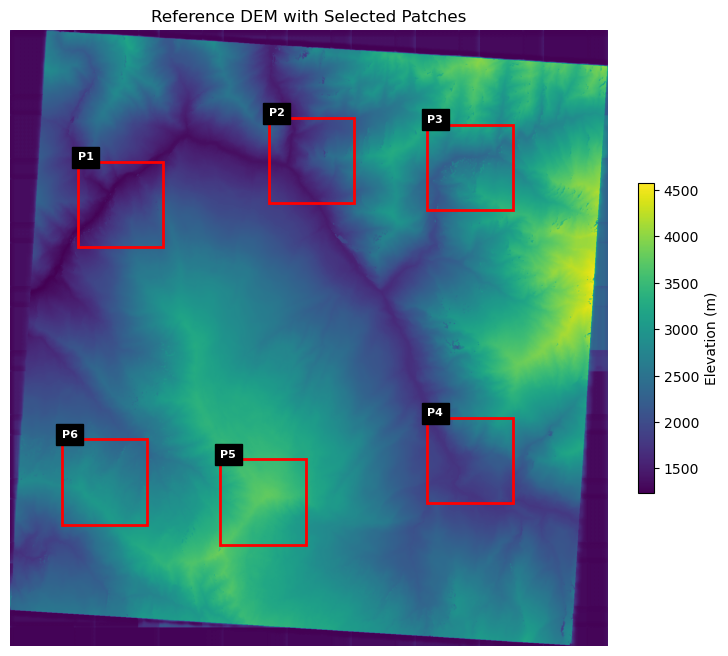

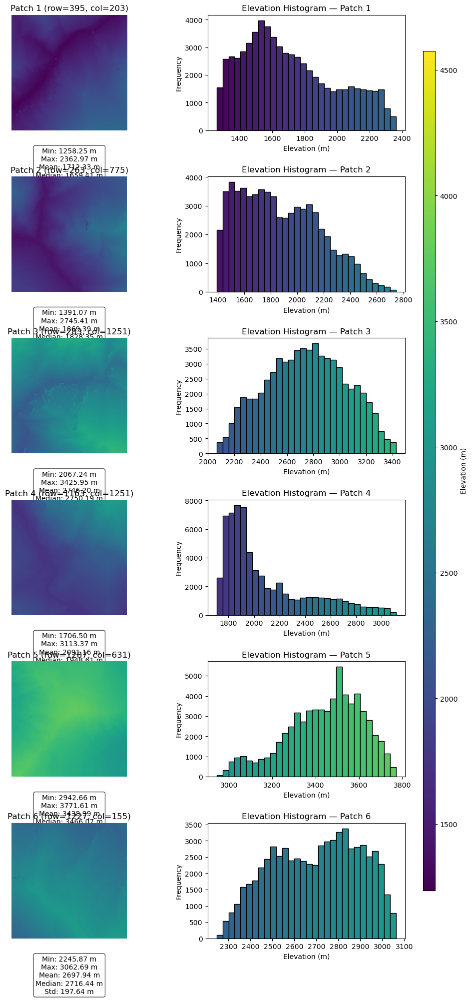

In [3]:
import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from scipy import stats

# ----------------------------
# 1. Parameters
# ----------------------------
PATCH_SIZE = 256  # Patch width & height
ref_dem_path = 'Filled_DEM_GAN__2.tif'

# Top-left corners (row, col) of each patch
patch_coords = [
    (395, 203),
    (263, 775),
    (283, 1251),
    (1163, 1251),
    (1287, 631),
    (1227, 155)
]

# ----------------------------
# 2. Load raster
# ----------------------------
def load_raster(path):
    with rasterio.open(path) as src:
        arr = src.read(1).astype(np.float32)
        nodata = src.nodata
        if nodata is not None:
            arr[arr == nodata] = np.nan
    return arr

dem = load_raster(ref_dem_path)

# ----------------------------
# 3. Extract patches & stats
# ----------------------------
patches_info = []
print("Patch statistics:")
print("-" * 60)
for i, (row, col) in enumerate(patch_coords, start=1):
    if row + PATCH_SIZE <= dem.shape[0] and col + PATCH_SIZE <= dem.shape[1]:
        patch = dem[row:row + PATCH_SIZE, col:col + PATCH_SIZE]
        stats_dict = {
            'patch_id': i,
            'row': row, 'col': col,
            'min': float(np.nanmin(patch)),
            'max': float(np.nanmax(patch)),
            'mean': float(np.nanmean(patch)),
            'median': float(np.nanmedian(patch)),
            'std': float(np.nanstd(patch))
        }
        patches_info.append({**stats_dict, 'data': patch})

        # Print to console
        print(f"Patch {i:>2} @ ({row:>4}, {col:>4}): "
              f"min={stats_dict['min']:.2f}, max={stats_dict['max']:.2f}, "
              f"mean={stats_dict['mean']:.2f}, median={stats_dict['median']:.2f}, "
              f"std={stats_dict['std']:.2f}")
    else:
        print(f"Patch {i} at ({row},{col}) out of bounds — skipped.")
print("-" * 60)

# ----------------------------
# 4. Visualize patches on full DEM
# ----------------------------
fig, ax = plt.subplots(figsize=(10, 8))
im_full = ax.imshow(dem, cmap='viridis')
ax.set_title("Reference DEM with Selected Patches")
for p in patches_info:
    rect = Rectangle((p['col'], p['row']), PATCH_SIZE, PATCH_SIZE,
                     edgecolor='red', facecolor='none', lw=2)
    ax.add_patch(rect)
    ax.text(p['col'], p['row'] - 5, f"P{p['patch_id']}", color='white',
            fontsize=8, weight='bold', backgroundcolor='black')
fig.colorbar(im_full, ax=ax, fraction=0.02, pad=0.04, label='Elevation (m)')
ax.axis('off')
plt.show()

# ----------------------------
# 5. Display each patch + histogram
# ----------------------------
n_patches = len(patches_info)
fig, axes = plt.subplots(n_patches, 2, figsize=(12, 4 * n_patches))
vmin, vmax = np.nanmin(dem), np.nanmax(dem)  # consistent color scale

for idx, p in enumerate(patches_info):
    ax_img, ax_hist = axes[idx]

    # Patch image
    im_patch = ax_img.imshow(p['data'], cmap='viridis', vmin=vmin, vmax=vmax)
    ax_img.set_title(f"Patch {p['patch_id']} (row={p['row']}, col={p['col']})")
    ax_img.axis('off')
    stats_text = (
        f"Min: {p['min']:.2f} m\n"
        f"Max: {p['max']:.2f} m\n"
        f"Mean: {p['mean']:.2f} m\n"
        f"Median: {p['median']:.2f} m\n"
        f"Std: {p['std']:.2f} m"
    )
    ax_img.text(0.5, -0.15, stats_text, transform=ax_img.transAxes,
                ha='center', va='top', fontsize=10,
                bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.3'))

    # Histogram
    flat = p['data'].ravel()[~np.isnan(p['data'].ravel())]
    bins = 30
    counts, bin_edges, patches_hist = ax_hist.hist(flat, bins=bins, edgecolor='black')
    ax_hist.set_title(f"Elevation Histogram — Patch {p['patch_id']}")
    ax_hist.set_xlabel('Elevation (m)')
    ax_hist.set_ylabel('Frequency')

    # Color bars by elevation
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    norm_centers = (bin_centers - vmin) / (vmax - vmin + 1e-12)
    cmap = plt.get_cmap('viridis')
    for c, bar in zip(norm_centers, patches_hist):
        bar.set_facecolor(cmap(c))

# Add a shared colorbar
fig.subplots_adjust(right=0.85, hspace=0.4)
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
fig.colorbar(im_patch, cax=cbar_ax, label='Elevation (m)')
plt.show()



--- Patch 1 @ (row=395, col=203) ---
alos_dem   | min=1287.000, max=2350.706, mean=1697.009, std=275.865, skew=0.548
flow_accu  | min=0.000, max=1.000, mean=0.209, std=0.215, skew=1.602
plan_curv  | min=0.019, max=0.994, mean=0.496, std=0.365, skew=0.035
prof_curv  | min=0.006, max=0.984, mean=0.468, std=0.328, skew=0.129
tang_curv  | min=0.010, max=0.988, mean=0.495, std=0.353, skew=0.036
str1500    | min=0.000, max=1.000, mean=0.022, std=0.146, skew=6.541
s2_b1      | min=0.085, max=0.447, mean=0.140, std=0.029, skew=1.702
s2_b2      | min=0.084, max=0.470, mean=0.161, std=0.034, skew=1.414
s2_b3      | min=0.078, max=0.501, mean=0.161, std=0.046, skew=1.209
s2_b4      | min=0.008, max=0.739, mean=0.271, std=0.087, skew=0.252

--- Patch 2 @ (row=263, col=775) ---
alos_dem   | min=1377.538, max=2716.377, mean=1855.856, std=296.859, skew=0.443
flow_accu  | min=0.000, max=1.000, mean=0.215, std=0.204, skew=1.609
plan_curv  | min=0.008, max=0.986, mean=0.511, std=0.353, skew=-0.038
prof

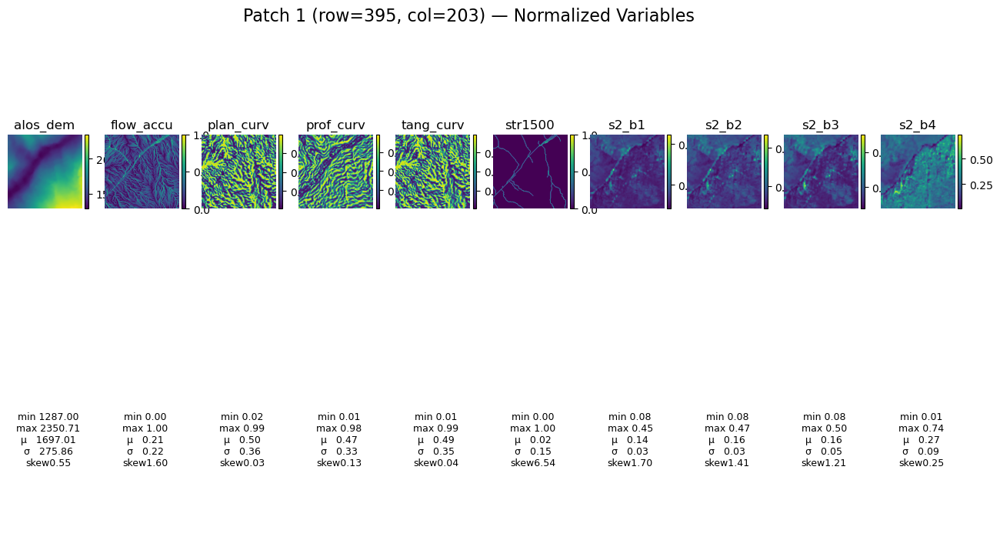

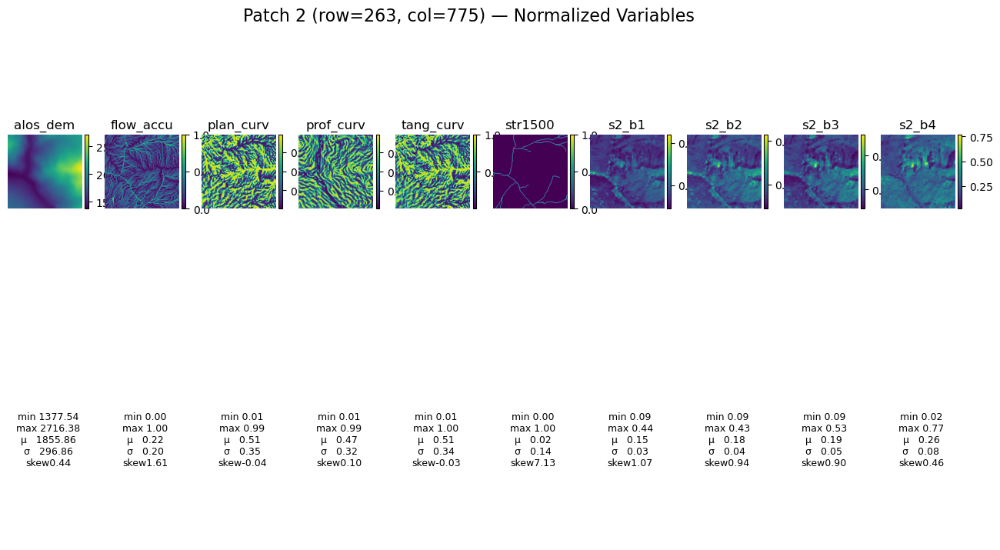

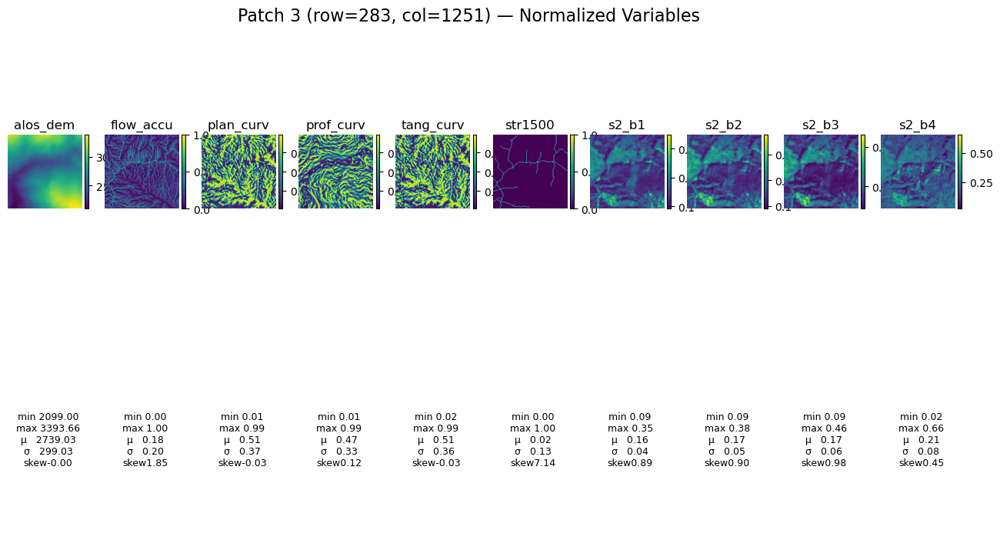

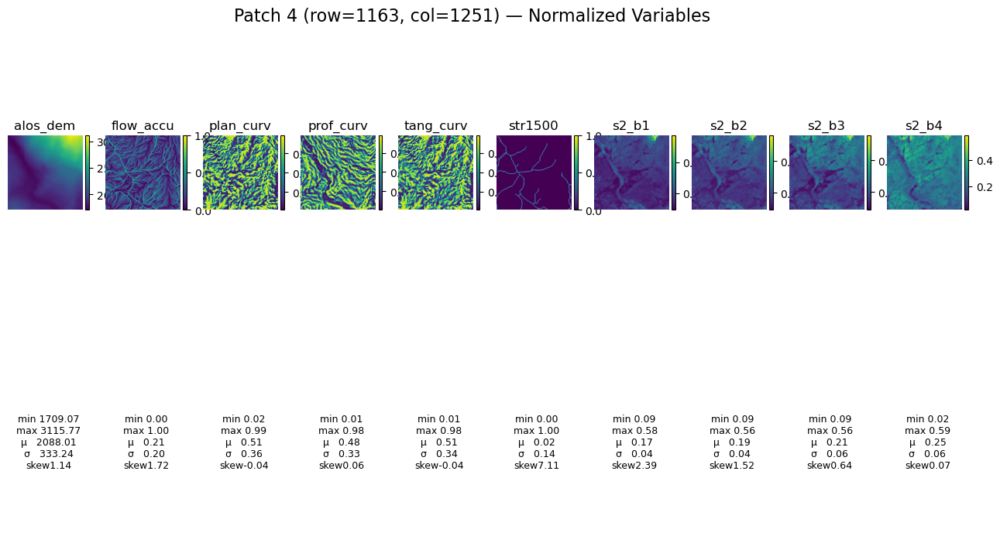

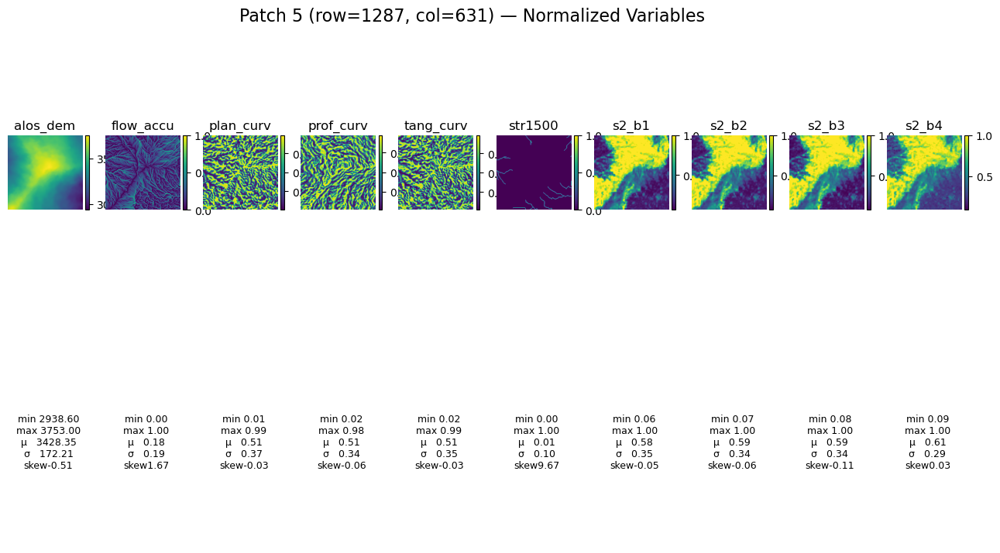

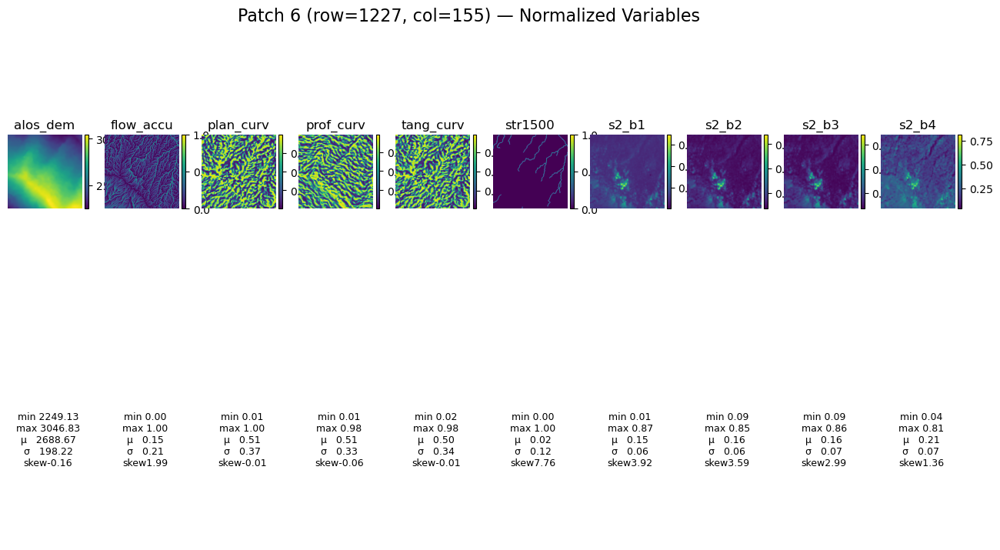

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.stats import skew  # import skew directly

# ----------------------------
# 0. Inputs in Memory
# ----------------------------
# processed: dict of normalized arrays keyed by:
#   'dem', 'flow', 'slope', 'plan_curv', 'prof_curv', 'tang_curv',
#   's2_b1' ... 's2_b7'

# Patch definitions
PATCH_SIZE = 256
patch_coords = [
    (395, 203),
    (263, 775),
    (283, 1251),
    (1163, 1251),
    (1287, 631),
    (1227, 155)
]

# Variable order for plotting
vars_to_plot = [
     'alos_dem', 'flow_accu', 'plan_curv',
    'prof_curv', 'tang_curv', 'str1500',
    's2_b1', 's2_b2', 's2_b3', 's2_b4'
]

# ----------------------------
# 1. Extract patches and stats
# ----------------------------
all_patches = []
for pid, (r, c) in enumerate(patch_coords, 1):
    patch_dict = {'id': pid, 'row': r, 'col': c, 'data': {}, 'stats': {}}
    for var in vars_to_plot:
        arr = processed[var]
        sub = arr[r:r+PATCH_SIZE, c:c+PATCH_SIZE]
        flat = sub.flatten()
        flat = flat[~np.isnan(flat)]
        # compute stats without shadowing
        var_stats = {
            'min':  np.nan if flat.size==0 else flat.min(),
            'max':  np.nan if flat.size==0 else flat.max(),
            'mean': np.nan if flat.size==0 else flat.mean(),
            'std':  np.nan if flat.size==0 else flat.std(),
            'skew': np.nan if flat.size==0 else skew(flat)
        }
        patch_dict['data'][var]  = sub
        patch_dict['stats'][var] = var_stats
    all_patches.append(patch_dict)

# ----------------------------
# 2. Print patch stats summary
# ----------------------------
for p in all_patches:
    print(f"\n--- Patch {p['id']} @ (row={p['row']}, col={p['col']}) ---")
    for var, st in p['stats'].items():
        print(f"{var:10s} | min={st['min']:.3f}, max={st['max']:.3f}, "
              f"mean={st['mean']:.3f}, std={st['std']:.3f}, skew={st['skew']:.3f}")

# ----------------------------
# 3. Visualize patches
# ----------------------------
for p in all_patches:
    pid = p['id']
    fig = plt.figure(figsize=(16, 8))
    gs = GridSpec(2, len(vars_to_plot), figure=fig, wspace=0.2, hspace=0.3)

    # Top row: maps
    for i, var in enumerate(vars_to_plot):
        ax = fig.add_subplot(gs[0, i])
        im = ax.imshow(p['data'][var], cmap='viridis')
        ax.set_title(var)
        ax.axis('off')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    # Bottom row: stats text
    for i, var in enumerate(vars_to_plot):
        ax = fig.add_subplot(gs[1, i])
        st = p['stats'][var]
        txt = (f"min {st['min']:.2f}\n"
               f"max {st['max']:.2f}\n"
               f"μ   {st['mean']:.2f}\n"
               f"σ   {st['std']:.2f}\n"
               f"skew{st['skew']:.2f}")
        ax.text(0.5, 0.5, txt, ha='center', va='center', fontsize=9)
        ax.axis('off')

    fig.suptitle(f"Patch {pid} (row={p['row']}, col={p['col']}) — Normalized Variables", fontsize=16)
    plt.show()


In [5]:
# ----------------------------
# 5. Patch Extraction & Saving (Updated)
# ----------------------------
import numpy as np
import rasterio

def extract_and_save_patches(processed_data, patch_coords, ref_dem_path):
    """
    Extract patches from ALOS DEM, support vars, and target DEM (GAN-filled),
    ensuring ALOS & target are raw elevation in meters.
    """
    PATCH_SIZE = 256  # Must match previous settings

    # Load GAN-filled DEM (ground truth)
    with rasterio.open(ref_dem_path) as src:
        target_dem = src.read(1).astype(np.float32)

    # Storage for each variable
    all_patches = {}
    all_patches['alos_dem'] = []     # <- RAW ALOS DEM (important!)
    all_patches['target'] = []       # <- RAW target DEM

    # Support variables (already normalized before calling this function)
    support_keys = [k for k in processed_data.keys() if k not in ['alos_dem']]
    for key in support_keys:
        all_patches[key] = []

    # Extract patches
    for r, c in patch_coords:
        # ALOS DEM: raw meters
        alos_patch = processed_data['alos_dem'][r:r+PATCH_SIZE, c:c+PATCH_SIZE]
        all_patches['alos_dem'].append(alos_patch)

        # Support variables: already normalized
        for key in support_keys:
            support_patch = processed_data[key][r:r+PATCH_SIZE, c:c+PATCH_SIZE]
            all_patches[key].append(support_patch)

        # Target DEM: raw meters
        target_patch = target_dem[r:r+PATCH_SIZE, c:c+PATCH_SIZE]
        all_patches['target'].append(target_patch)

    # Convert lists to numpy arrays
    for key in all_patches:
        all_patches[key] = np.array(all_patches[key])

    # Save
    np.save('processed_patches.npy', all_patches)
    print("✅ Saved all patches to processed_patches.npy (ALOS & target in meters)")


C:\Users\Asus\AppData\Local\Temp\ipykernel_984\1289824176.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,0.9,1])


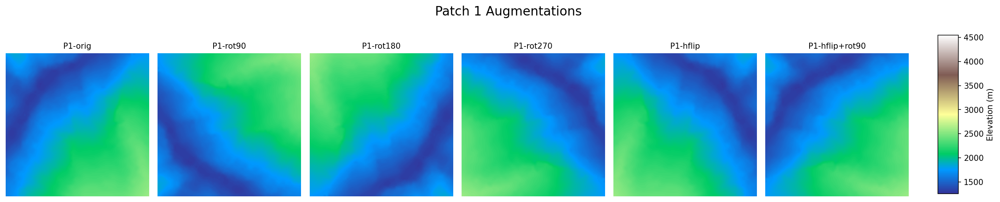

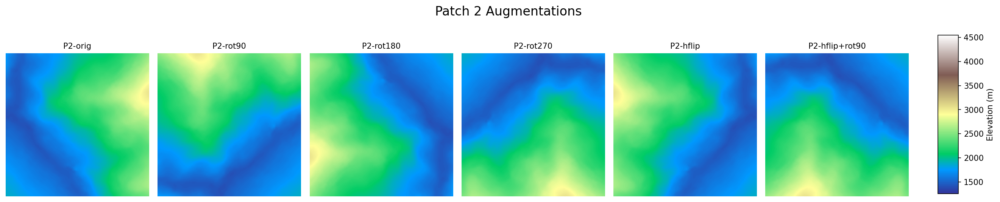

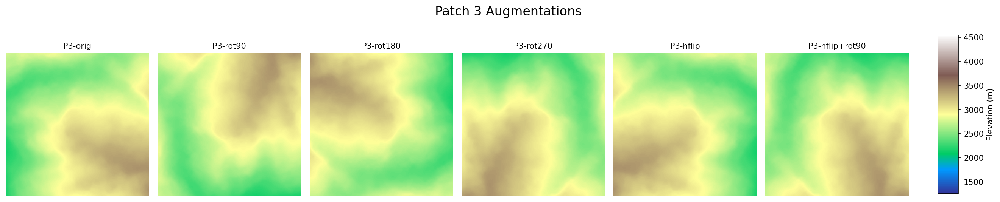

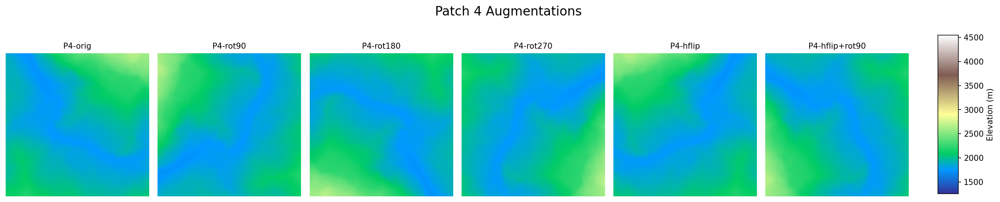

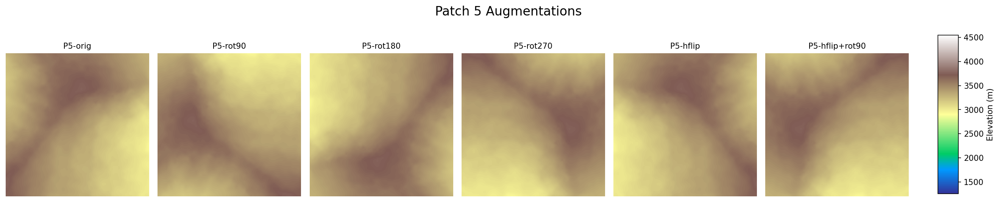

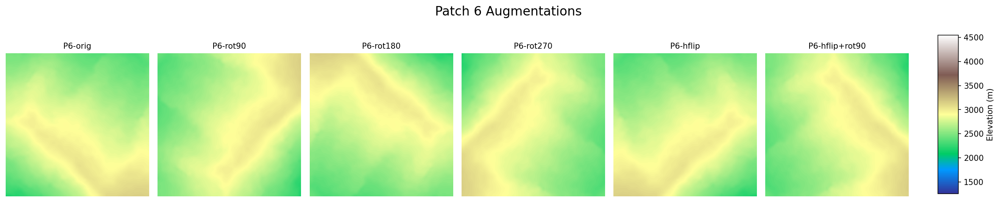

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------
# 1. Your six DEM patches
# ----------------------------
# Assume you've already loaded your DEM and extracted these six patches:
# patches_info = [
#     {'patch_id':1, 'data': dem_patch1},
#     ...
#     {'patch_id':6, 'data': dem_patch6}
# ]
# For example purposes, I'll rebuild from your earlier list:

PATCH_SIZE = 256
patch_coords = [
    (395, 203),
    (263, 775),
    (283, 1251),
    (1163, 1251),
    (1287, 631),
    (1227, 155)
]

import rasterio
def load_raster(path):
    with rasterio.open(path) as src:
        arr = src.read(1).astype(np.float32)
        arr[arr == src.nodata] = np.nan
    return arr

dem = load_raster('Alos_Resampled_2.tif')

patches_info = []
for pid, (r, c) in enumerate(patch_coords, 1):
    patch = dem[r:r+PATCH_SIZE, c:c+PATCH_SIZE]
    patches_info.append({'patch_id': pid, 'data': patch})

# ----------------------------
# 2. Augmentation function
# ----------------------------
def augment_patch(patch):
    """
    Given a 2D patch, return a list of augmented patches:
      original, rot90, rot180, rot270, hflip, hflip+rot90
    """
    aug = []
    aug.append(patch)  # original
    aug.append(np.rot90(patch, k=1))
    aug.append(np.rot90(patch, k=2))
    aug.append(np.rot90(patch, k=3))
    hflip = np.fliplr(patch)
    aug.append(hflip)
    aug.append(np.rot90(hflip, k=1))
    return aug

# ----------------------------
# 3. Visualize augmentations
# ----------------------------
for info in patches_info:
    pid = info['patch_id']
    orig = info['data']
    augmented = augment_patch(orig)
    titles = ['orig', 'rot90', 'rot180', 'rot270', 'hflip', 'hflip+rot90']

    fig, axes = plt.subplots(1, len(augmented), figsize=(18, 4), dpi=150)
    for ax, img, t in zip(axes, augmented, titles):
        im = ax.imshow(img, cmap='terrain', vmin=np.nanmin(dem), vmax=np.nanmax(dem))
        ax.set_title(f"P{pid}-{t}", fontsize=10)
        ax.axis('off')
    fig.suptitle(f"Patch {pid} Augmentations", fontsize=16)
    # colorbar once on the right
    cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    plt.colorbar(im, cax=cax, label='Elevation (m)')
    plt.tight_layout(rect=[0,0,0.9,1])
    plt.show()


In [7]:
# ----------------------------------------
# DS-HAT DEM SR Model Training Pipeline
# ----------------------------------------

import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import random
import os
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ----------------------------
# Load Preprocessed Patches
# ----------------------------
data = np.load("processed_patches.npy", allow_pickle=True).item()

main_var = 'alos_dem'
support_vars = [
    'flow_accu', 'plan_curv', 'slope', 'prof_curv', 'tang_curv',
    'str1500', 's2_b1', 's2_b2', 's2_b3', 's2_b4'
]

print(f"✅ Loaded Patch Data")
print(f"Main Input: {main_var}")
print(f"Supporting Inputs: {support_vars}")
print(f"Target Shape: {data['target'].shape}")

# ----------------------------
# Custom Dataset Class
# ----------------------------
from torch.utils.data import Dataset
import torch
import numpy as np
import random

class DEMPatchDataset(Dataset):
    def __init__(self, data_dict, support_keys, patch_size=256, train=True):
        self.alos = data_dict['alos_dem'].astype(np.float32)  # raw elevation
        self.target = data_dict['target'].astype(np.float32)  # raw elevation

        # Keep support normalized (already done before saving)
        self.support = np.stack([data_dict[k] for k in support_keys], axis=1)  # [N, C, H, W]

        # Patch-level 70/30 split
        self.indices = list(range(len(self.target)))
        random.seed(42)
        random.shuffle(self.indices)
        cutoff = int(0.7 * len(self.indices))
        self.indices = self.indices[:cutoff] if train else self.indices[cutoff:]

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        i = self.indices[idx]
        return {
            'alos': torch.tensor(self.alos[i][None], dtype=torch.float32),       # [1, H, W]
            'support': torch.tensor(self.support[i], dtype=torch.float32),       # [C, H, W]
            'target': torch.tensor(self.target[i][None], dtype=torch.float32)    # [1, H, W]
        }

# ----------------------------
# Create DataLoaders
# ----------------------------
train_set = DEMPatchDataset(data, support_vars, train=True)
test_set = DEMPatchDataset(data, support_vars, train=False)

train_loader = DataLoader(train_set, batch_size=2, shuffle=True)
test_loader = DataLoader(test_set, batch_size=1, shuffle=False)


print(f"🧠 Training Patches: {len(train_set)}")
print(f"🧪 Testing Patches: {len(test_set)}")

# ----------------------------
# DS-HAT DEM SR Model Components
# ----------------------------
class RRDB(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        def block(): return nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels, in_channels, 3, padding=1)
        )
        self.block1 = block()
        self.block2 = block()
        self.block3 = block()
        self.scale = 0.2

    def forward(self, x):
        res = self.block1(x)
        res = self.block2(res) + res * self.scale
        res = self.block3(res) + res * self.scale
        return x + res * self.scale

class SEBlock(nn.Module):
    def __init__(self, in_channels, reduction=4):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels // reduction, in_channels),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        w = self.pool(x).view(b, c)
        w = self.fc(w).view(b, c, 1, 1)
        return x * w

class AttentionFusion(nn.Module):
    def __init__(self, in_main=64, in_support=64):
        super().__init__()
        self.attn = nn.Sequential(
            nn.Conv2d(in_main + in_support, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, main, support):
        x = torch.cat([main, support], dim=1)
        alpha = self.attn(x)
        return alpha * main + (1 - alpha) * support

class DS_HAT_DEM(nn.Module):
    def __init__(self, in_channels=1, support_channels=10):
        super().__init__()
        self.head_main = nn.Conv2d(in_channels, 64, 3, padding=1)
        self.body_main = nn.Sequential(*[RRDB(64) for _ in range(5)])

        self.head_support = nn.Conv2d(support_channels, 64, 3, padding=1)
        self.body_support = nn.Sequential(
            nn.Conv2d(64, 64, 3, padding=1),
            SEBlock(64),
            nn.ReLU(inplace=True)
        )

        self.fusion = AttentionFusion()
        self.tail = nn.Sequential(
            nn.Conv2d(64, 32, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 1, 3, padding=1)
        )

    def forward(self, alos, support):
        x_main = self.body_main(self.head_main(alos))
        x_supp = self.body_support(self.head_support(support))
        x = self.fusion(x_main, x_supp)
        out = self.tail(x)
        return out

# ----------------------------
# Custom Gradient Loss
# ----------------------------
def gradient_loss(pred, target):
    dx = lambda x: x[..., 1:, :] - x[..., :-1, :]
    dy = lambda x: x[..., :, 1:] - x[..., :, :-1]
    return F.l1_loss(dx(pred), dx(target)) + F.l1_loss(dy(pred), dy(target))

# ----------------------------
# Training Function
# ----------------------------
def train_model(model, train_loader, test_loader, epochs=30, save_path='ds_hat_model.pt'):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"🖥️ Using device: {device}")
    
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    mae = nn.L1Loss()
    model = model.to(device)

    train_losses, test_losses = [], []

    for epoch in range(1, epochs + 1):
        model.train()
        epoch_loss = 0
        for i, batch in enumerate(train_loader):
            alos = batch['alos'].to(device)
            supp = batch['support'].to(device)
            target = batch['target'].to(device)

            # Optional shape print (epoch 1 only)
            if epoch == 1 and i == 0:
                print(f"📐 ALOS shape: {alos.shape}, Support shape: {supp.shape}")

            pred = model(alos, supp)
            loss_mae = mae(pred, target)
            loss_grad = gradient_loss(pred, target)
            loss = 0.85 * loss_mae + 0.10 * loss_grad

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        train_losses.append(epoch_loss / len(train_loader))

        # Evaluation
        model.eval()
        test_loss = 0
        with torch.no_grad():
            for batch in test_loader:
                alos = batch['alos'].to(device)
                supp = batch['support'].to(device)
                target = batch['target'].to(device)
                pred = model(alos, supp)
                loss = mae(pred, target)
                test_loss += loss.item()
        test_losses.append(test_loss / len(test_loader))

        print(f"🟢 Epoch {epoch:02d} | Train Loss: {train_losses[-1]:.4f} | Test Loss: {test_losses[-1]:.4f}")

        # Save final model
        if epoch == epochs:
            torch.save(model.state_dict(), save_path)
            print(f"✅ Model saved to {save_path}")

        # Plot loss curves
        if epoch % 5 == 0 or epoch == epochs:
            plt.figure(figsize=(10, 4))
            plt.plot(train_losses, label='Train Loss')
            plt.plot(test_losses, label='Test Loss')
            plt.title("Loss Over Epochs")
            plt.xlabel("Epoch")
            plt.ylabel("Loss")
            plt.legend()
            plt.grid()
            plt.show()



✅ Loaded Patch Data
Main Input: alos_dem
Supporting Inputs: ['flow_accu', 'plan_curv', 'slope', 'prof_curv', 'tang_curv', 'str1500', 's2_b1', 's2_b2', 's2_b3', 's2_b4']
Target Shape: (6, 256, 256)
🧠 Training Patches: 4
🧪 Testing Patches: 2


In [ ]:
# ----------------------------
# 🔁 Train the Model
# ----------------------------
model = DS_HAT_DEM(in_channels=1, support_channels=10)
train_model(model, train_loader, test_loader, epochs=150)


In [8]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import mean_absolute_error, mean_squared_error
import seaborn as sns

# ----------------------------
# 1. Load Model
# ----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DS_HAT_DEM(in_channels=1, support_channels=10).to(device)
model.load_state_dict(torch.load("ds_hat_model.pt", map_location=device))
model.eval()
print("✅ Model loaded for inference")

# ----------------------------
# 2. Inference on Test Set
# ----------------------------
results = []

with torch.no_grad():
    for batch in test_loader:
        alos = batch['alos'].to(device)
        support = batch['support'].to(device)
        target = batch['target'].to(device)

        pred = model(alos, support).cpu().numpy()[0, 0]
        target = target.cpu().numpy()[0, 0]

        results.append({
            'pred': pred,
            'target': target,
            'alos': alos.cpu().numpy()[0, 0]
        })

print(f"✅ Inference completed on {len(results)} test patches.")


C:\Users\Asus\AppData\Local\Temp\ipykernel_984\3812869606.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("ds_hat_model.pt", map_locati

✅ Model loaded for inference
✅ Inference completed on 2 test patches.


In [10]:
# Add this after your inference code
def save_sr_patches(all_results, ref_dem_path, output_dir='sr_outputs'):
    os.makedirs(output_dir, exist_ok=True)
    
    # Get spatial reference from original DEM
    with rasterio.open(ref_dem_path) as src:
        meta = src.meta.copy()
        transform = src.transform
        crs = src.crs
    
    for res in all_results:
        patch_id = res['id']
        pred = res['pred']
        
        # Calculate new transform for this patch
        row, col = patch_coords[patch_id-1]  # assuming order matches
        new_transform = rasterio.transform.from_origin(
            transform.xoff + col * transform.a,
            transform.yoff + row * transform.b,
            transform.a,
            transform.b
        )
        
        # Update metadata
        meta.update({
            'height': pred.shape[0],
            'width': pred.shape[1],
            'transform': new_transform,
            'dtype': 'float32',
            'nodata': np.nan,
            'crs': crs
        })
        
        # Save as GeoTIFF
        output_path = os.path.join(output_dir, f'DS-HAT_SR_DEM_Patch_{patch_id}.tif')
        with rasterio.open(output_path, 'w', **meta) as dst:
            dst.write(pred, 1)
        
        print(f"Saved: {output_path}")




📊 Patch 1 Metrics:
  MAE  = 31.929 m
  RMSE = 114.914 m
  SSIM = 0.9071


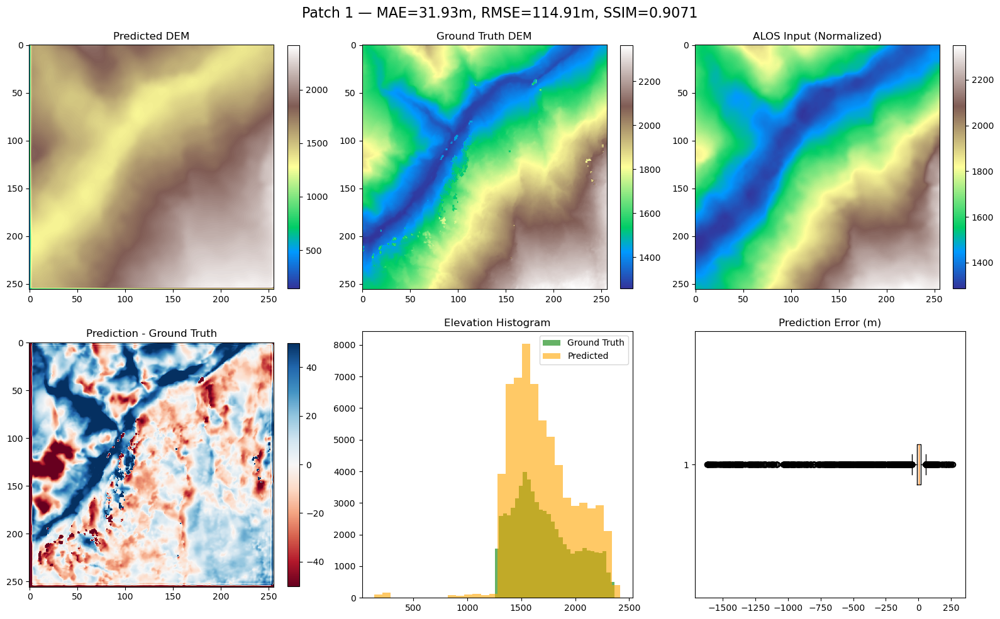


📊 Patch 2 Metrics:
  MAE  = 46.866 m
  RMSE = 175.449 m
  SSIM = 0.8566


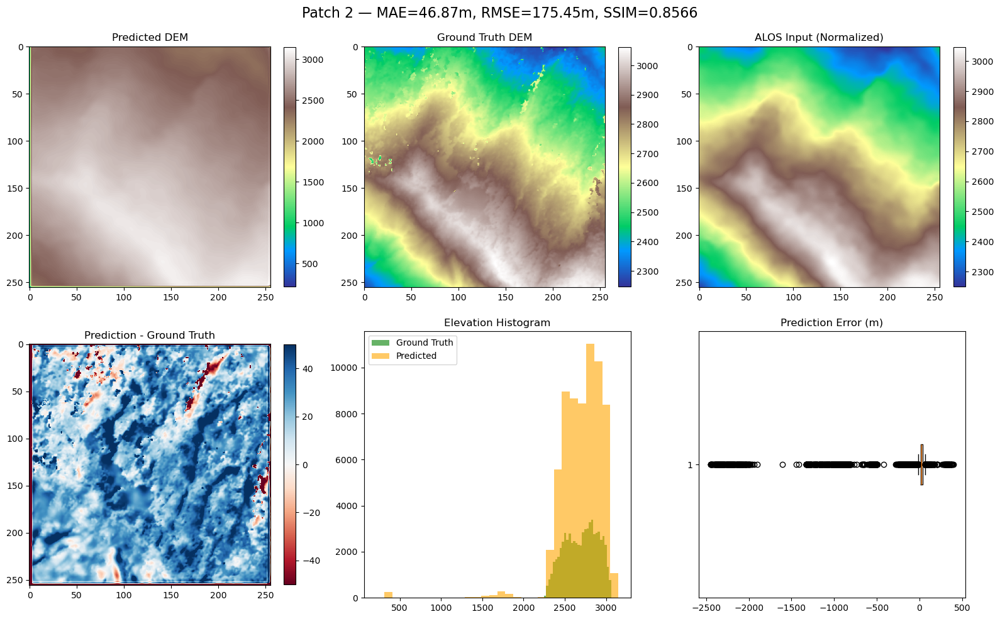

In [30]:
# ----------------------------
# 3. Evaluate Metrics
# ----------------------------
def compute_metrics(pred, target):
    mask = ~np.isnan(target)
    mae = mean_absolute_error(target[mask], pred[mask])
    rmse = np.sqrt(mean_squared_error(target[mask], pred[mask]))
    ssim_val = ssim(target, pred, data_range=target.max()-target.min())
    return mae, rmse, ssim_val

# ----------------------------
# 4. Visualize Patches & Metrics
# ----------------------------
for i, res in enumerate(results, 1):
    pred, target, alos = res['pred'], res['target'], res['alos']
    diff = pred - target
    mae, rmse, ssim_val = compute_metrics(pred, target)

    print(f"\n📊 Patch {i} Metrics:")
    print(f"  MAE  = {mae:.3f} m")
    print(f"  RMSE = {rmse:.3f} m")
    print(f"  SSIM = {ssim_val:.4f}")

    fig, axs = plt.subplots(2, 3, figsize=(16, 10))

    # Predicted DEM
    im0 = axs[0, 0].imshow(pred, cmap='terrain')
    axs[0, 0].set_title("Predicted DEM")
    plt.colorbar(im0, ax=axs[0, 0], fraction=0.045)

    # Ground Truth DEM
    im1 = axs[0, 1].imshow(target, cmap='terrain')
    axs[0, 1].set_title("Ground Truth DEM")
    plt.colorbar(im1, ax=axs[0, 1], fraction=0.045)

    # ALOS Input
    im2 = axs[0, 2].imshow(alos, cmap='terrain')
    axs[0, 2].set_title("ALOS Input (Normalized)")
    plt.colorbar(im2, ax=axs[0, 2], fraction=0.045)

    # Difference Heatmap
    im3 = axs[1, 0].imshow(diff, cmap='RdBu', vmin=-50, vmax=50)
    axs[1, 0].set_title("Prediction - Ground Truth")
    plt.colorbar(im3, ax=axs[1, 0], fraction=0.045)

    # Histogram of Elevation Values
    axs[1, 1].hist(target.flatten(), bins=30, alpha=0.6, label='Ground Truth', color='green')
    axs[1, 1].hist(pred.flatten(), bins=30, alpha=0.6, label='Predicted', color='orange')
    axs[1, 1].set_title("Elevation Histogram")
    axs[1, 1].legend()

    # Boxplot of Error
    axs[1, 2].boxplot(diff.flatten(), vert=False)
    axs[1, 2].set_title("Prediction Error (m)")

    fig.suptitle(f"Patch {i} — MAE={mae:.2f}m, RMSE={rmse:.2f}m, SSIM={ssim_val:.4f}", fontsize=16)
    plt.tight_layout()
    plt.show()


In [31]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr

# ----------------------------
# Inference on All 6 Patches
# ----------------------------
model.load_state_dict(torch.load("ds_hat_model.pt", map_location=device))
model.eval()

all_results = []

with torch.no_grad():
    for i in range(len(data['target'])):
        alos = torch.tensor(data['alos_dem'][i][None, None], dtype=torch.float32).to(device)
        support = torch.tensor(np.stack([data[k][i] for k in support_vars])[None], dtype=torch.float32).to(device)
        target = data['target'][i]

        pred = model(alos, support).cpu().numpy()[0, 0]

        all_results.append({
            'id': i + 1,
            'alos': alos.cpu().numpy()[0, 0],
            'target': target,
            'pred': pred
        })

print(f"✅ Super-resolved DEM created for all 6 patches")


C:\Users\Asus\AppData\Local\Temp\ipykernel_10816\2688137373.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("ds_hat_model.pt", map_loca

✅ Super-resolved DEM created for all 6 patches


In [32]:
def evaluate_patch_metrics(pred, target):
    mask = ~np.isnan(target)
    pred = pred[mask]
    target = target[mask]

    mae = mean_absolute_error(target, pred)
    rmse = np.sqrt(mean_squared_error(target, pred))
    nrmse = rmse / (target.max() - target.min())
    r, _ = pearsonr(target, pred)
    r2 = r2_score(target, pred)
    ssim_val = ssim(target.reshape(256, 256), pred.reshape(256, 256), data_range=target.max() - target.min())

    return {
        'MAE': mae,
        'RMSE': rmse,
        'NRMSE': nrmse,
        'R': r,
        'R2': r2,
        'SSIM': ssim_val
    }

# Collect metrics
metrics_list = []
for res in all_results:
    met = evaluate_patch_metrics(res['pred'], res['target'])
    met['Patch'] = res['id']
    metrics_list.append(met)

# Pretty Print
import pandas as pd
df_metrics = pd.DataFrame(metrics_list).set_index("Patch")
print(df_metrics.round(3))


          MAE     RMSE  NRMSE      R     R2   SSIM
Patch                                             
1      31.929  114.914  0.104  0.924  0.835  0.907
2      34.095  124.137  0.092  0.924  0.830  0.929
3      60.858  186.859  0.138  0.846  0.616  0.827
4      37.319  129.908  0.092  0.934  0.850  0.956
5      57.589  222.290  0.268  0.644 -0.618  0.925
6      46.866  175.449  0.215  0.763  0.212  0.857


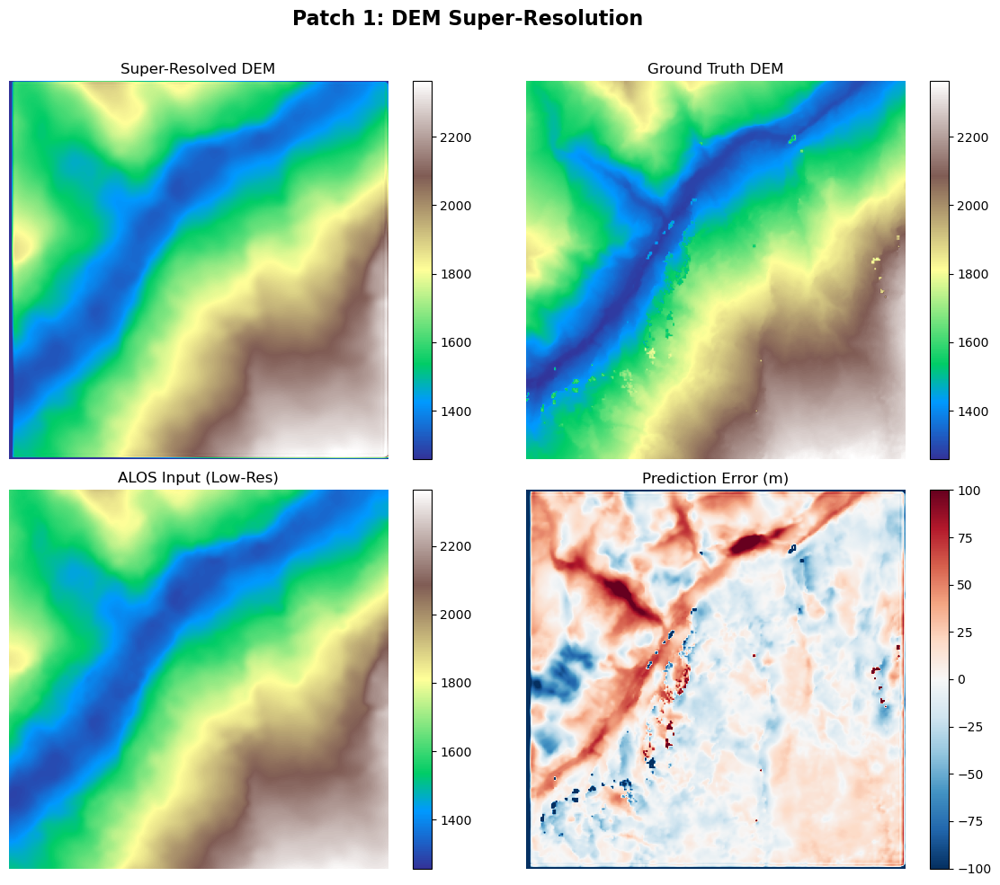

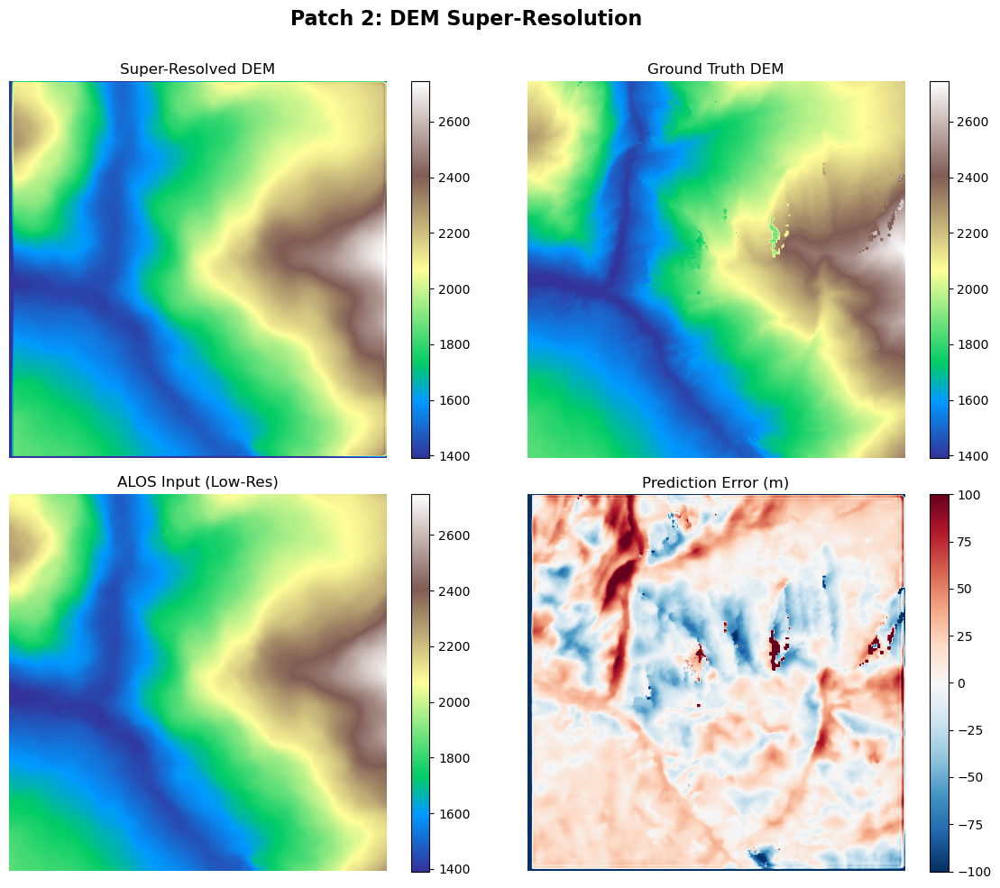

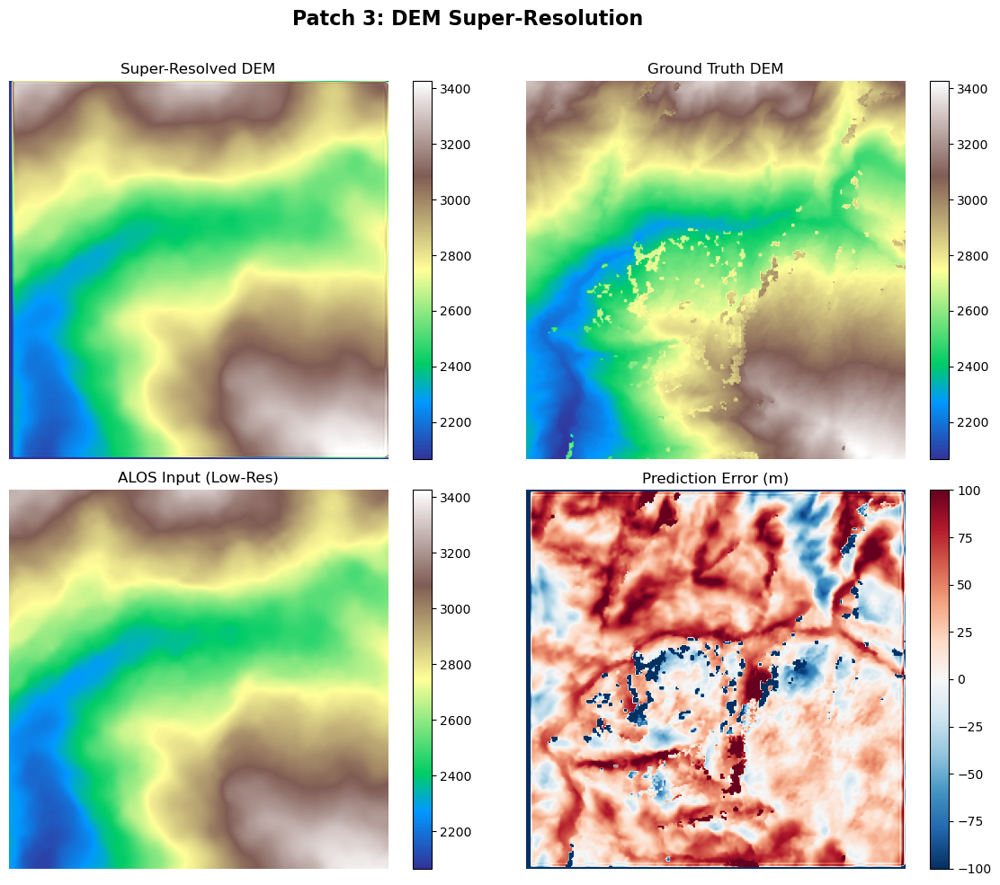

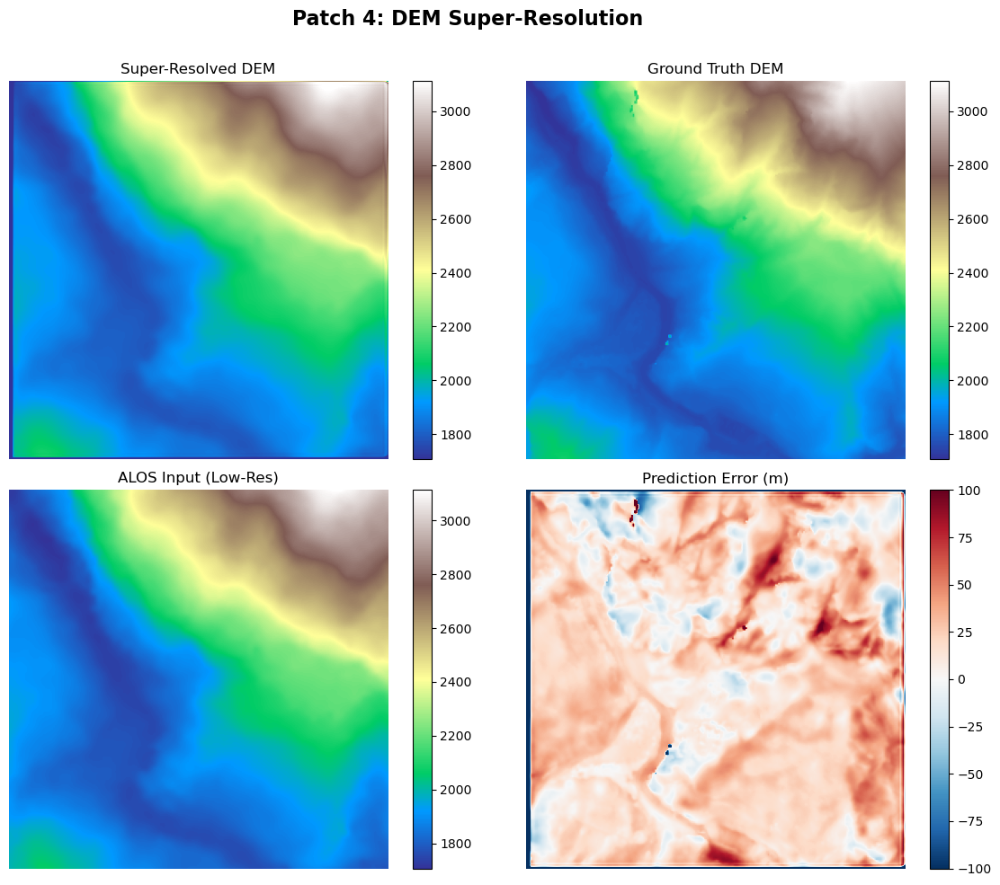

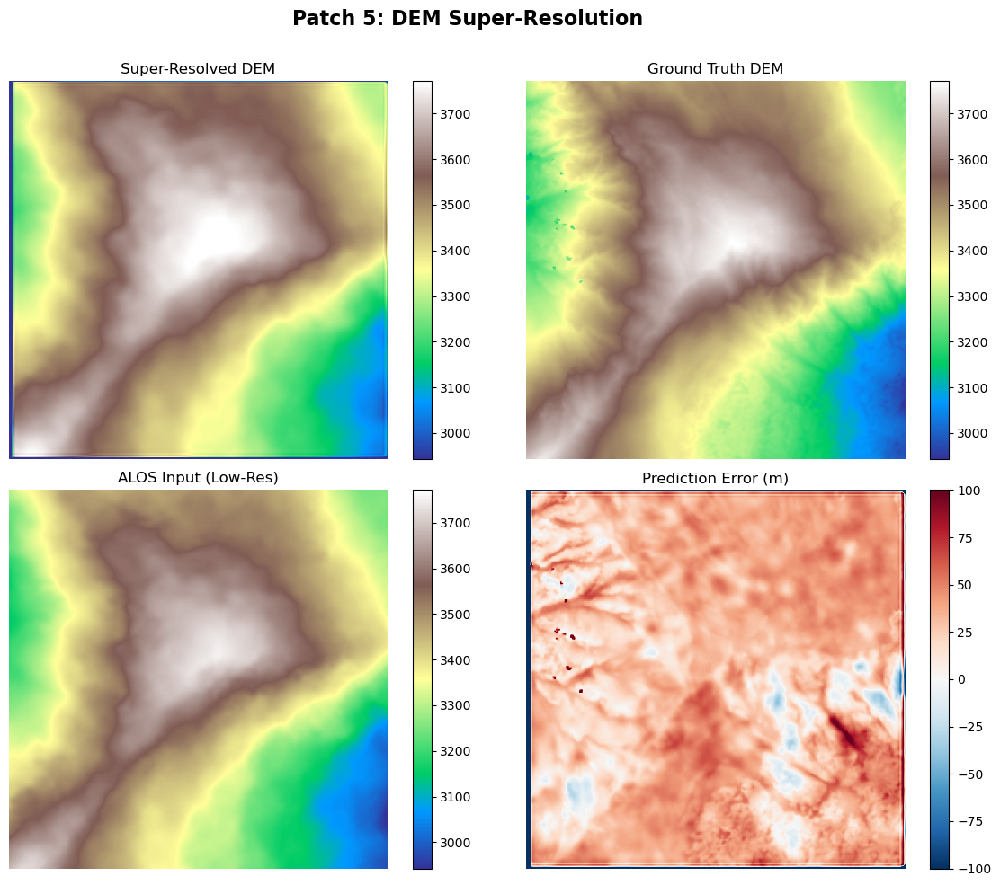

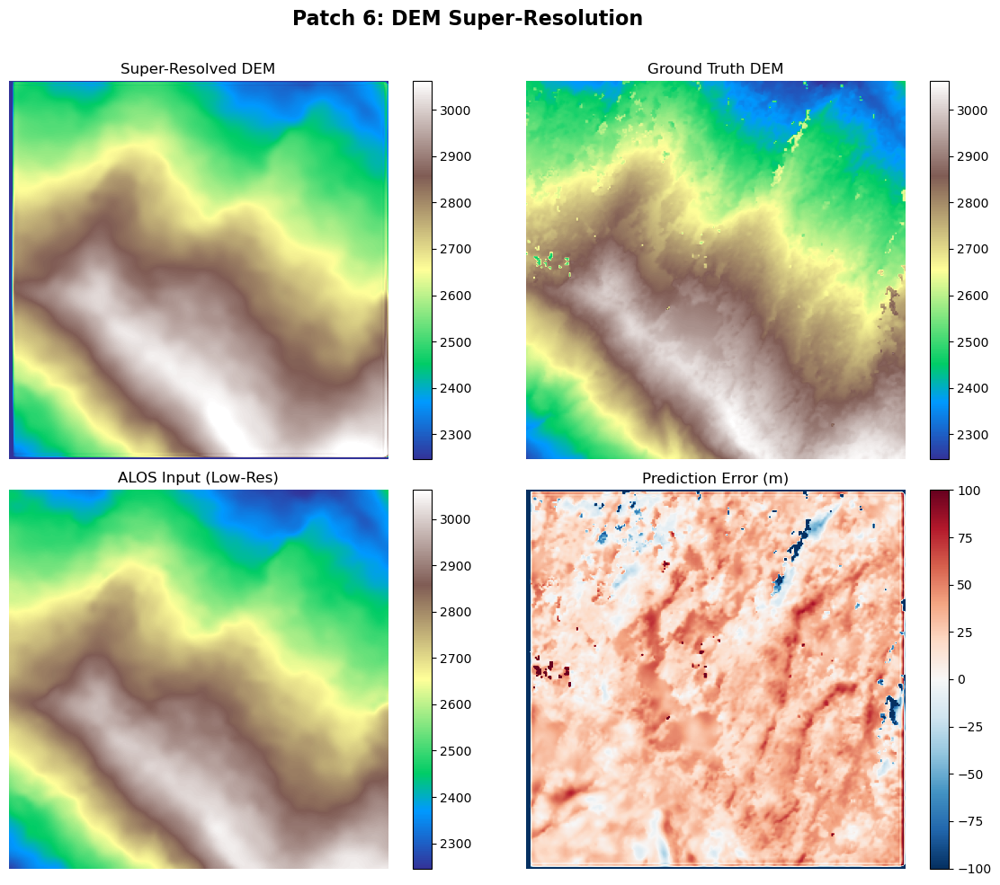

In [33]:
import seaborn as sns

for res in all_results:
    pred = res['pred']
    target = res['target']
    alos = res['alos']
    diff = pred - target
    patch_id = res['id']

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    cmap = 'terrain'

    # Predicted DEM
    im0 = axs[0, 0].imshow(pred, cmap=cmap, vmin=target.min(), vmax=target.max())
    axs[0, 0].set_title("Super-Resolved DEM")
    axs[0, 0].axis('off')
    fig.colorbar(im0, ax=axs[0, 0], fraction=0.046)

    # Ground Truth
    im1 = axs[0, 1].imshow(target, cmap=cmap, vmin=target.min(), vmax=target.max())
    axs[0, 1].set_title("Ground Truth DEM")
    axs[0, 1].axis('off')
    fig.colorbar(im1, ax=axs[0, 1], fraction=0.046)

    # Input ALOS DEM
    im2 = axs[1, 0].imshow(alos, cmap=cmap, vmin=target.min(), vmax=target.max())
    axs[1, 0].set_title("ALOS Input (Low-Res)")
    axs[1, 0].axis('off')
    fig.colorbar(im2, ax=axs[1, 0], fraction=0.046)

    # Difference Heatmap
    im3 = axs[1, 1].imshow(diff, cmap='RdBu_r', vmin=-100, vmax=100)
    axs[1, 1].set_title("Prediction Error (m)")
    axs[1, 1].axis('off')
    fig.colorbar(im3, ax=axs[1, 1], fraction=0.046)

    fig.suptitle(f"Patch {patch_id}: DEM Super-Resolution", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()


In [13]:
# ----------------------------
# 1. Generate All Results
# ----------------------------
# Initialize storage
all_results = []

# Run inference on all 6 patches
model.load_state_dict(torch.load("ds_hat_model.pt", map_location=device))
model.eval()

with torch.no_grad():
    for patch_id in range(6):  # For all 6 patches
        # Get data from your preprocessed patches
        alos_patch = data['alos_dem'][patch_id]
        support_patches = np.stack([data[k][patch_id] for k in support_vars])
        target_patch = data['target'][patch_id]
        
        # Convert to tensors
        alos_tensor = torch.tensor(alos_patch[None, None], dtype=torch.float32).to(device)
        support_tensor = torch.tensor(support_patches[None], dtype=torch.float32).to(device)
        
        # Inference
        pred_patch = model(alos_tensor, support_tensor).cpu().numpy()[0, 0]
        
        # Store results
        all_results.append({
            'id': patch_id + 1,  # Patches are 1-indexed
            'pred': pred_patch,
            'alos': alos_patch,
            'target': target_patch
        })

print(f"✅ Generated super-resolution results for {len(all_results)} patches")

# ----------------------------
# 2. Now Save All Patches
# ----------------------------
# Define patch coordinates (must match your earlier extraction)
PATCH_COORDS = [
    (395, 203),   # Patch 1
    (263, 775),   # Patch 2
    (283, 1251),  # Patch 3
    (1163, 1251), # Patch 4
    (1287, 631),  # Patch 5
    (1227, 155)   # Patch 6
]

save_all_dem_patches(
    all_results=all_results,
    ref_dem_path='Filled_DEM_GAN__2.tif',
    patch_coords=PATCH_COORDS
)

C:\Users\Asus\AppData\Local\Temp\ipykernel_984\3557646519.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("ds_hat_model.pt", map_locatio

✅ Generated super-resolution results for 6 patches
Saved: DEM_Patches\Patch_1_SR_DEM.tif
Saved: DEM_Patches\Patch_1_ALOS_DEM.tif
Saved: DEM_Patches\Patch_1_REFERENCE_DEM.tif
Saved: DEM_Patches\Patch_2_SR_DEM.tif
Saved: DEM_Patches\Patch_2_ALOS_DEM.tif
Saved: DEM_Patches\Patch_2_REFERENCE_DEM.tif
Saved: DEM_Patches\Patch_3_SR_DEM.tif
Saved: DEM_Patches\Patch_3_ALOS_DEM.tif
Saved: DEM_Patches\Patch_3_REFERENCE_DEM.tif
Saved: DEM_Patches\Patch_4_SR_DEM.tif
Saved: DEM_Patches\Patch_4_ALOS_DEM.tif
Saved: DEM_Patches\Patch_4_REFERENCE_DEM.tif
Saved: DEM_Patches\Patch_5_SR_DEM.tif
Saved: DEM_Patches\Patch_5_ALOS_DEM.tif
Saved: DEM_Patches\Patch_5_REFERENCE_DEM.tif
Saved: DEM_Patches\Patch_6_SR_DEM.tif
Saved: DEM_Patches\Patch_6_ALOS_DEM.tif
Saved: DEM_Patches\Patch_6_REFERENCE_DEM.tif
